In [1]:
##Tutorial by https://uci-genpals.github.io/pseudotime/2021/02/09/scvelo-tutorial.html

import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import os
import pandas as pd
import scvelo as scv
import cellrank as cr

# Get the current working directory
current_directory = os.getcwd()
print("Current Working Directory:", current_directory)


Current Working Directory: /data/gpfs/projects/punim1466/analysis/velocity/real_scVelo_20240330


In [2]:
# load sparse matrix:
X = io.mmread("counts_spliced.mtx")

# create anndata object
adata = anndata.AnnData(
    X=X.transpose().tocsr()
)

# load cell metadata:
cell_meta = pd.read_csv("metadata.csv")

# load gene names:
with open("gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

# set anndata observations and index obs by barcodes, var by gene names
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

# load dimensional reduction:
pca = pd.read_csv("pca.csv")
pca.index = adata.obs.index

# set pca and umap
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T



In [3]:
adata

AnnData object with n_obs × n_vars = 10000 × 36601
    obs: 'orig.ident', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous', 'Type', 'Group', 'barcode_og', 'barcode_af', 'barcode_af1', 'barcode_af2', 'cell_type_recluster', 'barcode', 'UMAP_1', 'UMAP_2'
    obsm: 'X_pca', 'X_umap'

In [4]:
#https://github.com/satijalab/seurat/issues/3654
s = scv.read("E11_spliced.csv")
u = scv.read("E11_unspliced.csv")
adata.layers['spliced'] = s.X
adata.layers['unspliced'] = u.X
#adata.layers['counts'] = adata.X

In [5]:
# Combine spliced and unspliced layers to create Y
Y = adata.layers['spliced'] + adata.layers['unspliced']

# Update adata.X with the combined feature matrix
adata.X = Y

In [6]:
adata.layers['spliced']

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [7]:
adata.layers['unspliced']

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [8]:
adata.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


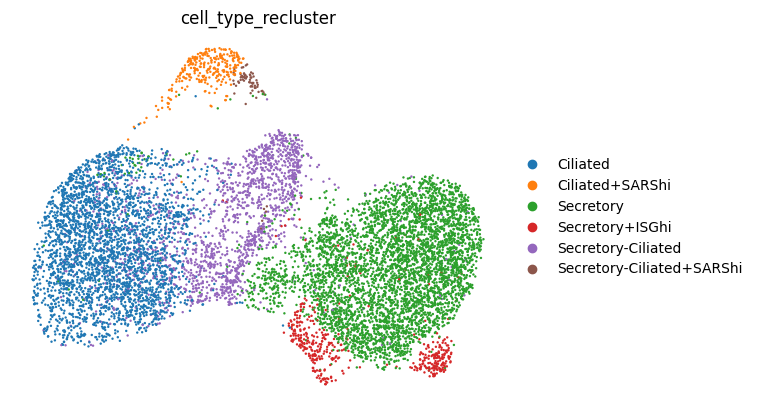

In [9]:
# plot a UMAP colored by sampleID to test:
sc.pl.umap(adata, color=['cell_type_recluster'], frameon=False, save=True)

# save dataset as anndata format
adata.write('my_data.h5ad')

# reload dataset
adata = sc.read_h5ad('my_data.h5ad')

In [10]:
#pip install cellrank

In [11]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad

scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False)
cr.settings.verbosity = 2

In [12]:
adata

AnnData object with n_obs × n_vars = 10000 × 36601
    obs: 'orig.ident', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous', 'Type', 'Group', 'barcode_og', 'barcode_af', 'barcode_af1', 'barcode_af2', 'cell_type_recluster', 'barcode', 'UMAP_1', 'UMAP_2'
    uns: 'cell_type_recluster_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'

In [13]:
# merge matrices into the original adata object
#adata = scv.utils.merge(adata, ldata)

/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


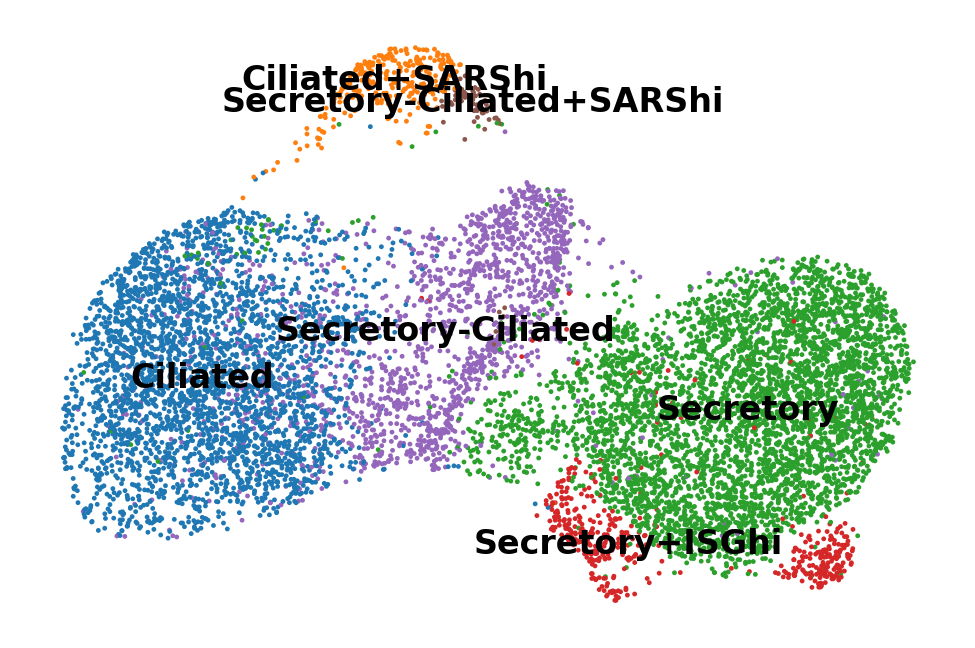

In [14]:
sc.pl.umap(adata, color='cell_type_recluster', frameon=False, legend_loc='on data', title='', save='_celltypes.pdf')

In [15]:
print(adata.obs.head())

                   orig.ident  nCount_spliced  nFeature_spliced  \
barcode                                                           
AATTTCCGTTAGAGTA_1  possorted           12377              4139   
ACCAACAAGACAACAT_1  possorted           16386              4940   
AAGACTCTCCCTCGTA_1  possorted             495               390   
AAGTGAAGTGGCTACC_1  possorted           20891              4146   
ACCCTCAAGTTTAGGA_1  possorted           12205              3740   

                    nCount_unspliced  nFeature_unspliced  nCount_ambiguous  \
barcode                                                                      
AATTTCCGTTAGAGTA_1              9520                3541              2325   
ACCAACAAGACAACAT_1             10008                3659              2830   
AAGACTCTCCCTCGTA_1               106                  99                80   
AAGTGAAGTGGCTACC_1              3919                2046              2495   
ACCCTCAAGTTTAGGA_1              5534                2504      

In [16]:
print(adata.obs['cell_type_recluster'].dtype)  # Check data type

category


In [17]:
print(adata.obs['cell_type_recluster'].unique())  # Print unique values

['Ciliated', 'Secretory-Ciliated', 'Secretory+ISGhi', 'Secretory', 'Ciliated+SARShi', 'Secretory-Ciliated+SARShi']
Categories (6, object): ['Ciliated', 'Ciliated+SARShi', 'Secretory', 'Secretory+ISGhi', 'Secretory-Ciliated', 'Secretory-Ciliated+SARShi']


In [18]:
adata

AnnData object with n_obs × n_vars = 10000 × 36601
    obs: 'orig.ident', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous', 'Type', 'Group', 'barcode_og', 'barcode_af', 'barcode_af1', 'barcode_af2', 'cell_type_recluster', 'barcode', 'UMAP_1', 'UMAP_2'
    uns: 'cell_type_recluster_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'

saving figure to file ./figures/scvelo_proportions_proportions.pdf


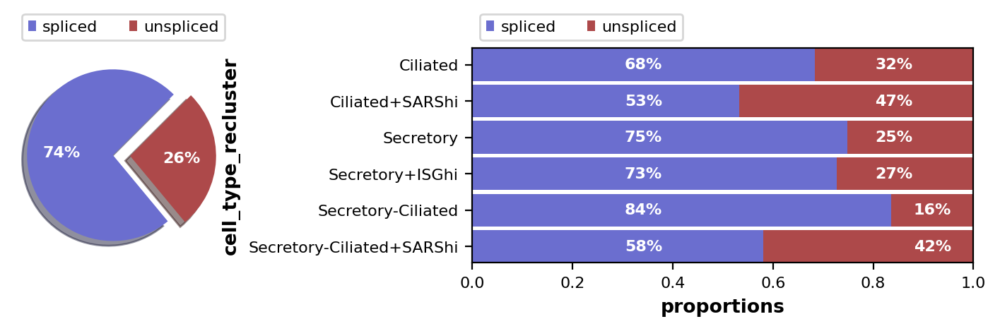

In [19]:
scv.pl.proportions(adata, groupby='cell_type_recluster', save='proportions.pdf')

In [20]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)

Filtered out 23952 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


In [21]:
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

computing neighbors
    finished (0:00:20) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [22]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/72 cores)


  0%|          | 0/821 [00:00<?, ?gene/s]

    finished (0:09:18) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [23]:
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/72 cores)


  0%|          | 0/10000 [00:00<?, ?cells/s]

    finished (0:00:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

saving figure to file ./figures/scvelo_embedding_stream_dynamical.svg


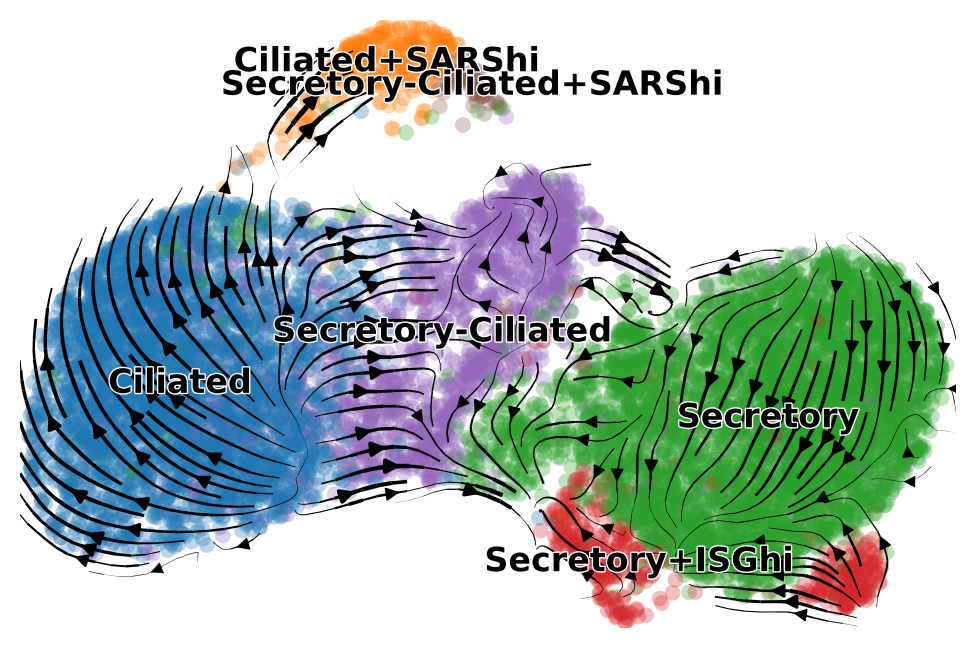

In [24]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['cell_type_recluster'], save='embedding_stream_dynamical.svg', title='')

In [25]:
adata

AnnData object with n_obs × n_vars = 10000 × 2000
    obs: 'orig.ident', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous', 'Type', 'Group', 'barcode_og', 'barcode_af', 'barcode_af1', 'barcode_af2', 'cell_type_recluster', 'barcode', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'cell_type_recluster_colors', 'log1p', 'neighbors', 'recover_dynamics', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'loss'
    layers: 'spliced', 'unspliced

In [26]:
df = adata

In [27]:
df

AnnData object with n_obs × n_vars = 10000 × 2000
    obs: 'orig.ident', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous', 'Type', 'Group', 'barcode_og', 'barcode_af', 'barcode_af1', 'barcode_af2', 'cell_type_recluster', 'barcode', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'cell_type_recluster_colors', 'log1p', 'neighbors', 'recover_dynamics', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'loss'
    layers: 'spliced', 'unspliced

In [28]:
df = df[:, (df.var['fit_likelihood'] > 0.1) & df.var['velocity_genes']]

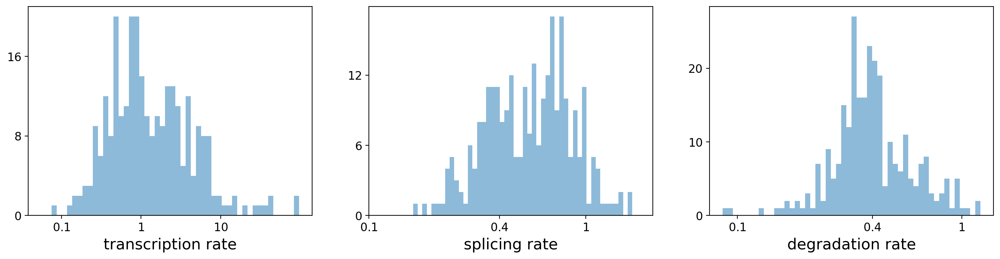

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
CFAP74,0.311338,0.482897,0.555300,0.378531,6.431642,1.750226,0.437187,0.337215,2.438295e-01,0.0,0.0,0.469530,1.340870,0.781587,0.670053,1.494944
PLA2G2A,0.584870,2.253054,36.306080,2.252403,6.133677,0.072871,0.009521,0.176055,1.998548e-04,0.0,0.0,0.376477,0.060518,1.006653,1.139307,0.488104
KIF17,0.013778,0.238642,0.520934,0.317020,3.309355,3.409516,0.134478,0.065079,2.324003e-13,0.0,0.0,0.484545,0.726926,0.392966,3.970653,0.928985
WNT4,0.093587,0.716724,3.259660,0.387980,6.542158,0.217299,0.066044,0.372313,1.006340e-01,0.0,0.0,0.493053,0.300474,1.290747,2.855819,1.482377
UBXN11,0.043821,1.679606,1.751595,0.205107,2.920613,0.160531,0.288707,0.849766,2.518355e-02,0.0,0.0,0.498803,1.181205,1.715623,12.824135,1.596366


In [29]:
kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df.var['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df.var['fit_beta'] * df.var['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df.var['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()


computing terminal states
    identified 3 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

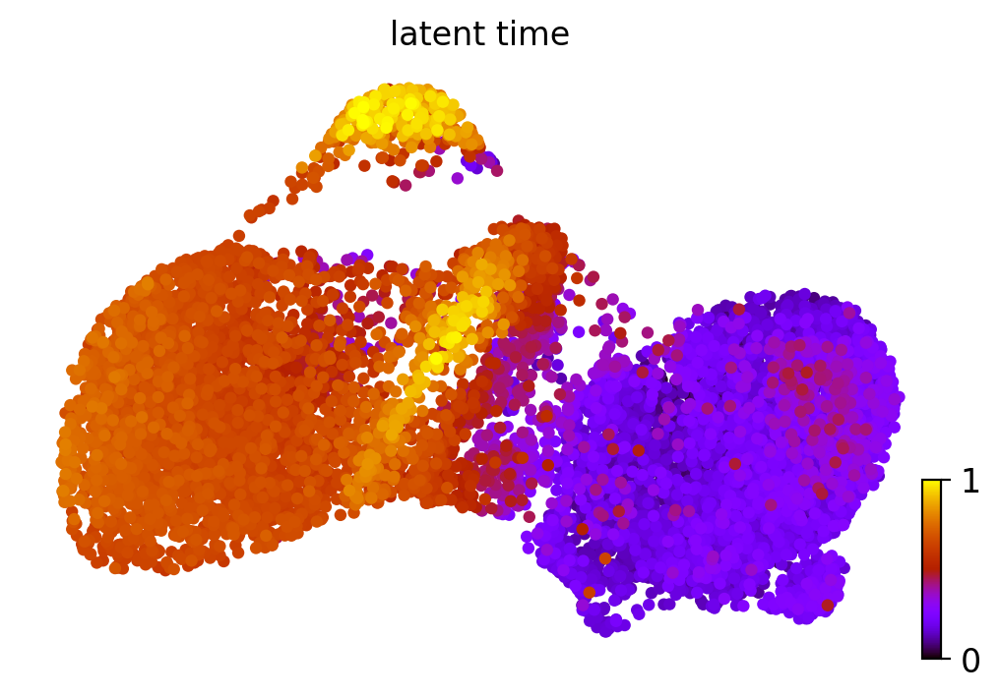

In [30]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)


/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


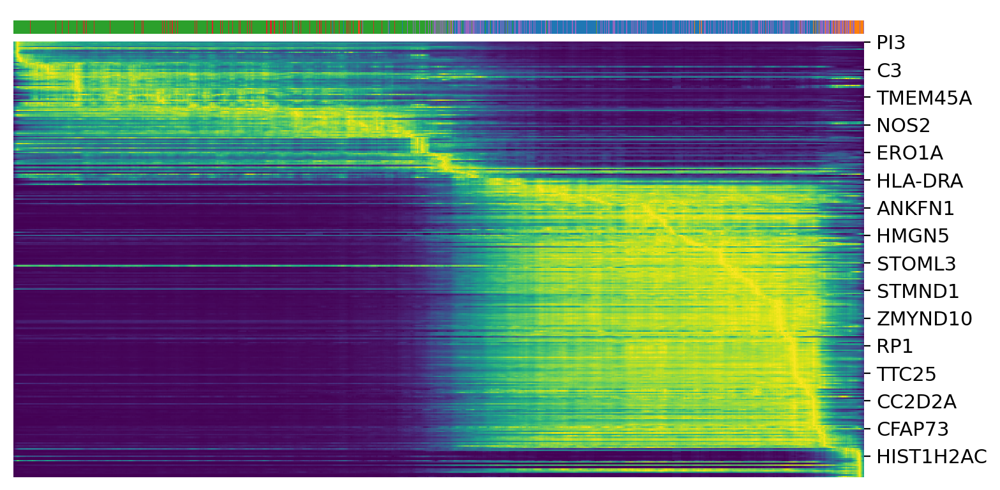

In [31]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='cell_type_recluster', n_convolve=100)

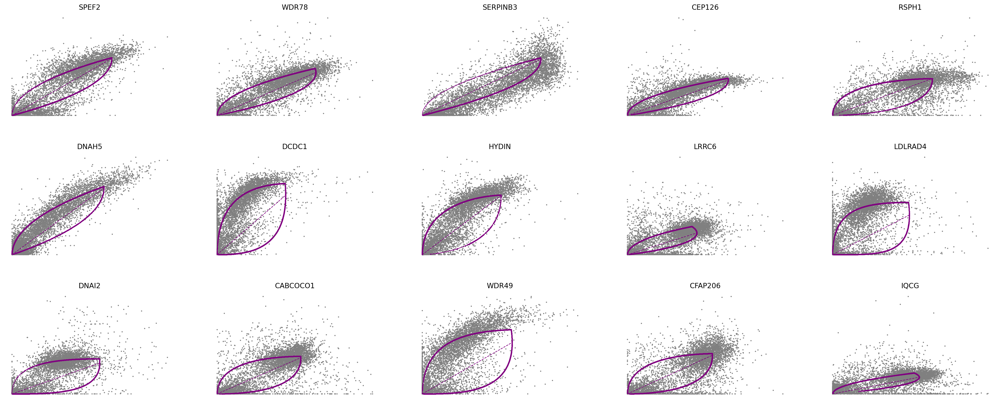

In [32]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False)



In [33]:
scv.tl.rank_dynamical_genes(adata, groupby='cell_type_recluster')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)


ranking genes by cluster-specific likelihoods
    finished (0:00:04) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/core/_anndata.py:245: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if is_categorical_dtype(data.obs[key])


,Ciliated,Ciliated+SARShi,Secretory,Secretory+ISGhi,Secretory-Ciliated,Secretory-Ciliated+SARShi
0,SPEF2,TMEM232,SERPINB3,SERPINB3,DNAH5,IGFL2-AS1
1,WDR78,PLA2G4C,FER1L6,FER1L6,SPEF2,THSD7A
2,CEP126,AC011287.1,GPRC5A,CAPN13,SERPINB3,AC108477.2
3,HYDIN,LHFPL3-AS2,RNF39,SLC6A14,ERICH3,AL353759.1
4,RSPH1,LANCL1-AS1,SLC6A14,BPIFB1,CFAP299,NID1


/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

saving figure to file ./figures/scvelo_velocity_panel.png


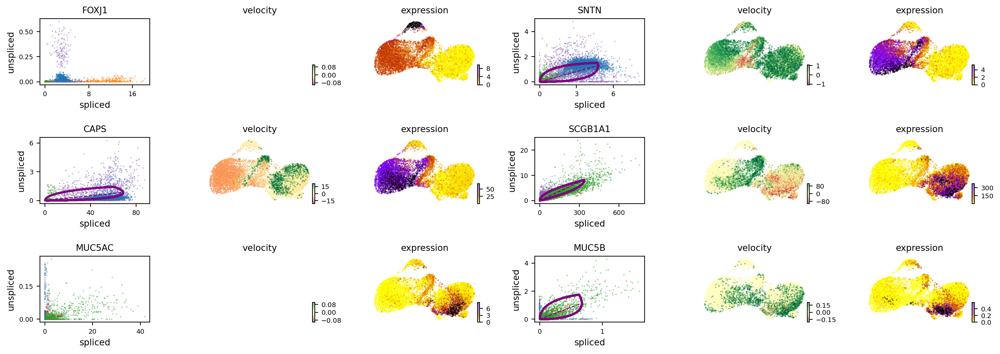

In [34]:
scv.pl.velocity(adata, ['FOXJ1', 'SNTN', 'CAPS', 'SCGB1A1', 'MUC5AC','MUC5B'], ncols=2, color='cell_type_recluster', save='velocity_panel.png')

/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

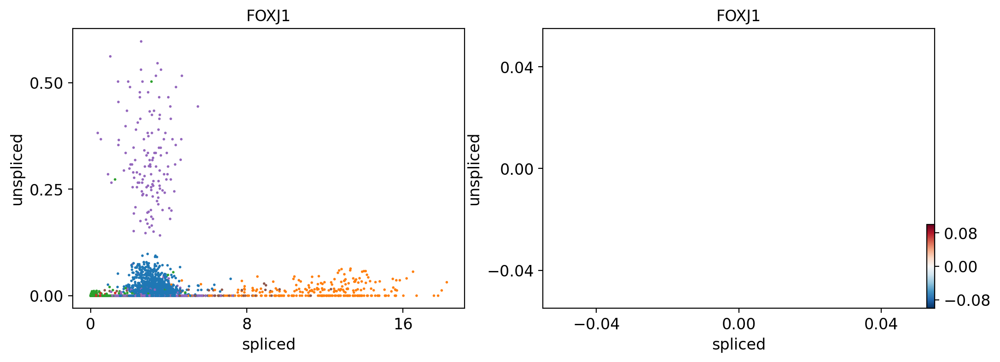

In [35]:
scv.pl.scatter(adata, 'FOXJ1', color=['cell_type_recluster', 'velocity'])

/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

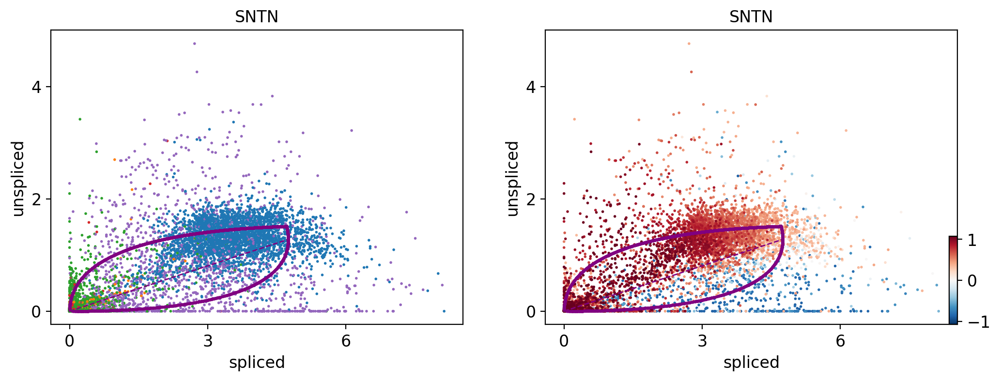

In [36]:
scv.pl.scatter(adata, 'SNTN', color=['cell_type_recluster', 'velocity'])

/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

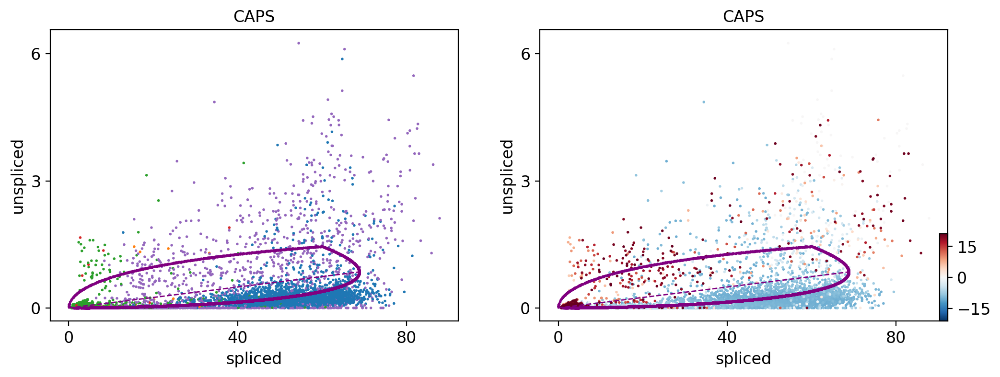

In [37]:
scv.pl.scatter(adata, 'CAPS', color=['cell_type_recluster', 'velocity'])

/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

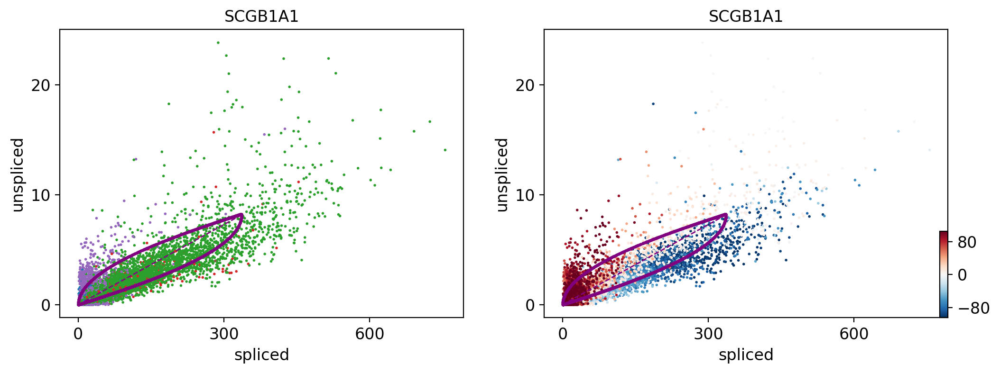

In [38]:
scv.pl.scatter(adata, 'SCGB1A1', color=['cell_type_recluster', 'velocity'])

/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

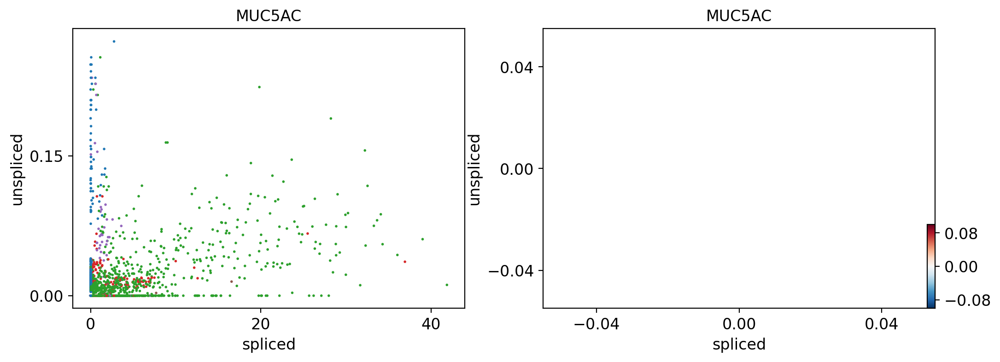

In [39]:
scv.pl.scatter(adata, 'MUC5AC', color=['cell_type_recluster', 'velocity'])

/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

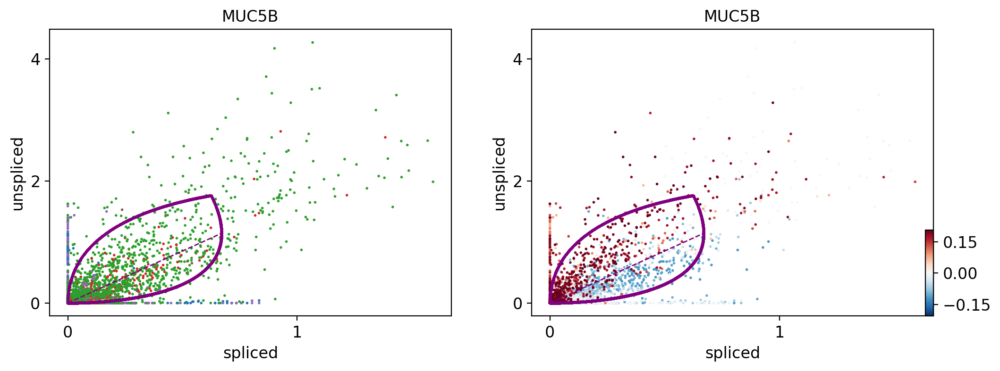

In [40]:
scv.pl.scatter(adata, 'MUC5B', color=['cell_type_recluster', 'velocity'])

/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

saving figure to file ./figures/scvelo_velocity_panel_scatter.pdf


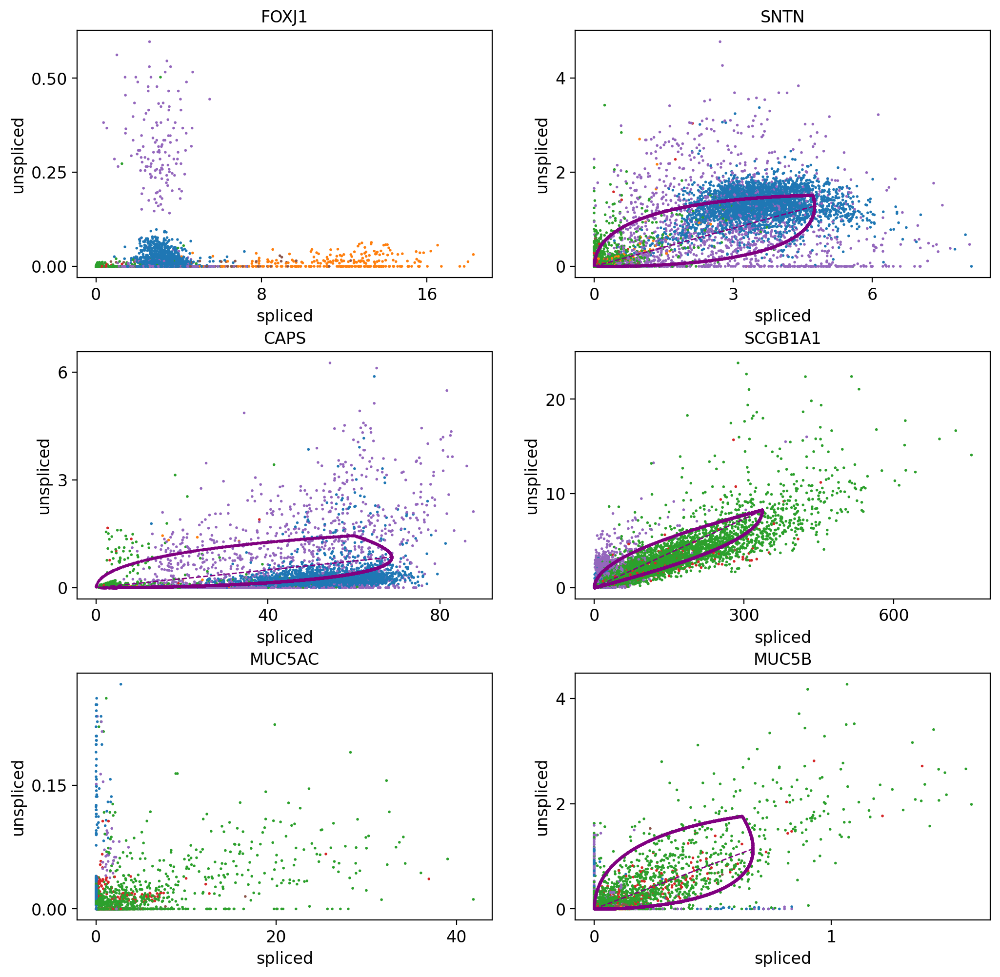

In [41]:
scv.pl.scatter(adata, ['FOXJ1', 'SNTN', 'CAPS', 'SCGB1A1', 'MUC5AC','MUC5B'], ncols=2, color='cell_type_recluster', save='velocity_panel_scatter.pdf')

In [42]:
# this is needed due to a current bug - bugfix is coming soon.
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

scv.tl.paga(adata, groups='cell_type_recluster')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T


running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:02) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/core/_anndata.py:245: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if is_categorical_dtype(data.obs[key])


/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data/gpfs/projects/punim1466/analysis/velocity/scVelo_file/scVelo/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in

saving figure to file ./figures/scvelo_paga_dynamical.pdf


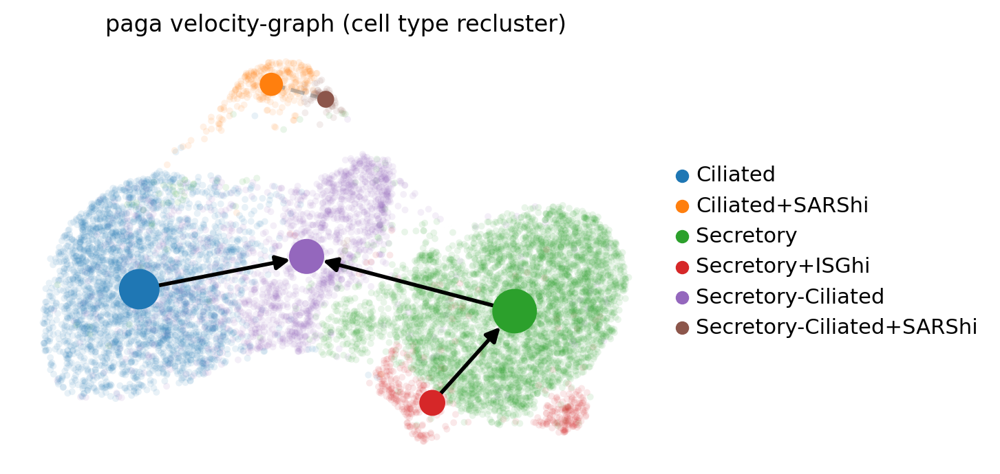

In [43]:
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, save='paga_dynamical.pdf')

In [44]:
print(scv.__version__)

0.3.2
